In [1]:
import geopandas as gpd

c:\Users\Gaia3D\AppData\Local\Programs\Python\Python311\Lib\site-packages\geopandas\_compat.py:124: UserWarning: The Shapely GEOS version (3.11.1-CAPI-1.17.1) is incompatible with the GEOS version PyGEOS was compiled with (3.10.4-CAPI-1.16.2). Conversions between both will be slow.
  warnings.warn(
C:\Users\Gaia3D\AppData\Local\Temp\ipykernel_14388\3841419929.py:1: DeprecationWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas still uses PyGEOS by default. However, starting with version 0.14, the default will switch to Shapely. To force to use Shapely 2.0 now, you can either uninstall PyGEOS or set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In the next release, GeoPandas will switch to using Shapely by default, even if PyGEOS is installed. If you only have PyGEOS installed to get speed-ups, this switch sho

In [2]:
gdf_pg = gpd.read_file('../data/geo_zn_ocn_lvb_sarea.shp', encoding="UTF-8")
gdf_pg.info()
gdf_pg.head()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 5 entries, 0 to 4
Data columns (total 4 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   gid         5 non-null      int64   
 1   sarea_korn  5 non-null      object  
 2   ssea_id     5 non-null      object  
 3   geometry    5 non-null      geometry
dtypes: geometry(1), int64(1), object(2)
memory usage: 292.0+ bytes


,gid,sarea_korn,ssea_id,geometry
0,5,동해남부,ES,"POLYGON ((129.66570 35.06455, 129.40532 34.971..."
1,4,남해동부,SE,"POLYGON ((127.82165 33.16382, 127.80000 33.121..."
2,3,서해,W,"POLYGON ((127.00000 38.00000, 127.00000 35.300..."
3,2,남해서부,SW,"POLYGON ((126.27256 30.28900, 126.21167 30.271..."
4,1,동해중부,EM,"POLYGON ((132.14285 36.50000, 129.30000 36.500..."


In [3]:
gdf_pt = gpd.read_file('../data/geo_mbris_obis_edu_light.gpkg', encoding="UTF-8")
gdf_pt.info()
gdf_pt.head()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 68552 entries, 0 to 68551
Data columns (total 21 columns):
 #   Column      Non-Null Count  Dtype   
---  ------      --------------  -----   
 0   spc_scitf_  68552 non-null  object  
 1   comm_kor_n  51114 non-null  object  
 2   genus       68500 non-null  object  
 3   genus_nm    51288 non-null  object  
 4   family      68516 non-null  object  
 5   family_nm   51227 non-null  object  
 6   order_      68518 non-null  object  
 7   order_nm    50936 non-null  object  
 8   class       68541 non-null  object  
 9   class_nm    53513 non-null  object  
 10  phylum      68543 non-null  object  
 11  phylum_nm   64048 non-null  object  
 12  kingdom     68552 non-null  object  
 13  kingdom_nm  68552 non-null  object  
 14  lati_val    68552 non-null  float64 
 15  loti_val    68552 non-null  float64 
 16  col_bg_dt   68552 non-null  object  
 17  ssea_id     68552 non-null  object  
 18  sstrnc_no   67965 non-null  object  
 

,spc_scitf_,comm_kor_n,genus,genus_nm,family,family_nm,order_,order_nm,class,class_nm,...,phylum_nm,kingdom,kingdom_nm,lati_val,loti_val,col_bg_dt,ssea_id,sstrnc_no,kind,geometry
0,Alkalihalobacillus algicola,None,Alkalihalobacillus,None,Bacillaceae,None,Caryophanales,None,Bacilli,None,...,None,Bacteria,세균계,37.284444,126.556389,20090626,W,5154-4,mbris,POINT (126.55639 37.28444)
1,Alkalihalobacillus algicola,None,Alkalihalobacillus,None,Bacillaceae,None,Caryophanales,None,Bacilli,None,...,None,Bacteria,세균계,37.284444,126.556389,20081224,W,5154-4,mbris,POINT (126.55639 37.28444)
2,Alkalihalobacillus algicola,None,Alkalihalobacillus,None,Bacillaceae,None,Caryophanales,None,Bacilli,None,...,None,Bacteria,세균계,37.284444,126.556389,20090626,W,5154-4,mbris,POINT (126.55639 37.28444)
3,Alkalihalobacillus algicola,None,Alkalihalobacillus,None,Bacillaceae,None,Caryophanales,None,Bacilli,None,...,None,Bacteria,세균계,37.284444,126.556389,20090626,W,5154-4,mbris,POINT (126.55639 37.28444)
4,Bacillus pumilus,None,Bacillus,None,Bacillaceae,None,Caryophanales,None,Bacilli,None,...,None,Bacteria,세균계,37.284444,126.556389,20090325,W,5154-4,mbris,POINT (126.55639 37.28444)


In [4]:
# 아래 코드 셀에서 공간조인 기능을 하는 geopandas의 sjoin을 실행할 때 에러가 나는 경우 아래의 패키지를 설치하고 다시 실행해 주십시오
# !pip install rtree 
# !pip install pygeos

In [5]:
# 종분포(포인트)에 해양생물해역(폴리곤)를 공간조인  
gdf = gpd.sjoin(gdf_pt, gdf_pg )
gdf.info()
gdf.head()

C:\Users\Gaia3D\AppData\Local\Temp\ipykernel_14388\3914417971.py:2: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:4326
Right CRS: GEOGCS["WGS 84",DATUM["WGS_1984",SPHEROID["WGS 84" ...

  gdf = gpd.sjoin(gdf_pt, gdf_pg )


<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 68552 entries, 0 to 64272
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   spc_scitf_     68552 non-null  object  
 1   comm_kor_n     51114 non-null  object  
 2   genus          68500 non-null  object  
 3   genus_nm       51288 non-null  object  
 4   family         68516 non-null  object  
 5   family_nm      51227 non-null  object  
 6   order_         68518 non-null  object  
 7   order_nm       50936 non-null  object  
 8   class          68541 non-null  object  
 9   class_nm       53513 non-null  object  
 10  phylum         68543 non-null  object  
 11  phylum_nm      64048 non-null  object  
 12  kingdom        68552 non-null  object  
 13  kingdom_nm     68552 non-null  object  
 14  lati_val       68552 non-null  float64 
 15  loti_val       68552 non-null  float64 
 16  col_bg_dt      68552 non-null  object  
 17  ssea_id_left   68552 non-nul

,spc_scitf_,comm_kor_n,genus,genus_nm,family,family_nm,order_,order_nm,class,class_nm,...,loti_val,col_bg_dt,ssea_id_left,sstrnc_no,kind,geometry,index_right,gid,sarea_korn,ssea_id_right
0,Alkalihalobacillus algicola,None,Alkalihalobacillus,None,Bacillaceae,None,Caryophanales,None,Bacilli,None,...,126.556389,20090626,W,5154-4,mbris,POINT (126.55639 37.28444),2,3,서해,W
1,Alkalihalobacillus algicola,None,Alkalihalobacillus,None,Bacillaceae,None,Caryophanales,None,Bacilli,None,...,126.556389,20081224,W,5154-4,mbris,POINT (126.55639 37.28444),2,3,서해,W
2,Alkalihalobacillus algicola,None,Alkalihalobacillus,None,Bacillaceae,None,Caryophanales,None,Bacilli,None,...,126.556389,20090626,W,5154-4,mbris,POINT (126.55639 37.28444),2,3,서해,W
3,Alkalihalobacillus algicola,None,Alkalihalobacillus,None,Bacillaceae,None,Caryophanales,None,Bacilli,None,...,126.556389,20090626,W,5154-4,mbris,POINT (126.55639 37.28444),2,3,서해,W
4,Bacillus pumilus,None,Bacillus,None,Bacillaceae,None,Caryophanales,None,Bacilli,None,...,126.556389,20090325,W,5154-4,mbris,POINT (126.55639 37.28444),2,3,서해,W


In [6]:
# 종분포에서 "서해" 에 해당하는 데이터만 추출
gdf2 = gdf[ gdf.sarea_korn == '서해'  ]
gdf2.info()
gdf2.head()

<class 'geopandas.geodataframe.GeoDataFrame'>
Index: 11125 entries, 0 to 65191
Data columns (total 25 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   spc_scitf_     11125 non-null  object  
 1   comm_kor_n     7403 non-null   object  
 2   genus          11119 non-null  object  
 3   genus_nm       7879 non-null   object  
 4   family         11120 non-null  object  
 5   family_nm      7641 non-null   object  
 6   order_         11120 non-null  object  
 7   order_nm       7563 non-null   object  
 8   class          11120 non-null  object  
 9   class_nm       8417 non-null   object  
 10  phylum         11120 non-null  object  
 11  phylum_nm      9655 non-null   object  
 12  kingdom        11125 non-null  object  
 13  kingdom_nm     11125 non-null  object  
 14  lati_val       11125 non-null  float64 
 15  loti_val       11125 non-null  float64 
 16  col_bg_dt      11125 non-null  object  
 17  ssea_id_left   11125 non-nul

,spc_scitf_,comm_kor_n,genus,genus_nm,family,family_nm,order_,order_nm,class,class_nm,...,loti_val,col_bg_dt,ssea_id_left,sstrnc_no,kind,geometry,index_right,gid,sarea_korn,ssea_id_right
0,Alkalihalobacillus algicola,None,Alkalihalobacillus,None,Bacillaceae,None,Caryophanales,None,Bacilli,None,...,126.556389,20090626,W,5154-4,mbris,POINT (126.55639 37.28444),2,3,서해,W
1,Alkalihalobacillus algicola,None,Alkalihalobacillus,None,Bacillaceae,None,Caryophanales,None,Bacilli,None,...,126.556389,20081224,W,5154-4,mbris,POINT (126.55639 37.28444),2,3,서해,W
2,Alkalihalobacillus algicola,None,Alkalihalobacillus,None,Bacillaceae,None,Caryophanales,None,Bacilli,None,...,126.556389,20090626,W,5154-4,mbris,POINT (126.55639 37.28444),2,3,서해,W
3,Alkalihalobacillus algicola,None,Alkalihalobacillus,None,Bacillaceae,None,Caryophanales,None,Bacilli,None,...,126.556389,20090626,W,5154-4,mbris,POINT (126.55639 37.28444),2,3,서해,W
4,Bacillus pumilus,None,Bacillus,None,Bacillaceae,None,Caryophanales,None,Bacilli,None,...,126.556389,20090325,W,5154-4,mbris,POINT (126.55639 37.28444),2,3,서해,W


In [7]:
# geopandas.explore를 이용한 지도화
gdf2.explore('phylum_nm',categorical=True, tiles='http://xdworld.vworld.kr:8080/2d/Satellite/service/{z}/{x}/{y}.jpeg', attr='브이월드')

c:\Users\Gaia3D\AppData\Local\Programs\Python\Python311\Lib\site-packages\geopandas\plotting.py:957: UserWarning: Glyph 44537 (\N{HANGUL SYLLABLE GEUG}) missing from current font.
  plt.draw()
c:\Users\Gaia3D\AppData\Local\Programs\Python\Python311\Lib\site-packages\geopandas\plotting.py:957: UserWarning: Glyph 54588 (\N{HANGUL SYLLABLE PI}) missing from current font.
  plt.draw()
c:\Users\Gaia3D\AppData\Local\Programs\Python\Python311\Lib\site-packages\geopandas\plotting.py:957: UserWarning: Glyph 46041 (\N{HANGUL SYLLABLE DONG}) missing from current font.
  plt.draw()
c:\Users\Gaia3D\AppData\Local\Programs\Python\Python311\Lib\site-packages\geopandas\plotting.py:957: UserWarning: Glyph 47932 (\N{HANGUL SYLLABLE MUL}) missing from current font.
  plt.draw()
c:\Users\Gaia3D\AppData\Local\Programs\Python\Python311\Lib\site-packages\geopandas\plotting.py:957: UserWarning: Glyph 47928 (\N{HANGUL SYLLABLE MUN}) missing from current font.
  plt.draw()
c:\Users\Gaia3D\AppData\Local\Programs\

<Axes: >

C:\Users\Gaia3D\AppData\Roaming\Python\Python311\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 44537 (\N{HANGUL SYLLABLE GEUG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\Gaia3D\AppData\Roaming\Python\Python311\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 54588 (\N{HANGUL SYLLABLE PI}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\Gaia3D\AppData\Roaming\Python\Python311\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 46041 (\N{HANGUL SYLLABLE DONG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\Gaia3D\AppData\Roaming\Python\Python311\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 47932 (\N{HANGUL SYLLABLE MUL}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)
C:\Users\Gaia3D\AppData\Roaming\Python\Python311\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 47928 (\N{HANGUL SYLLABLE

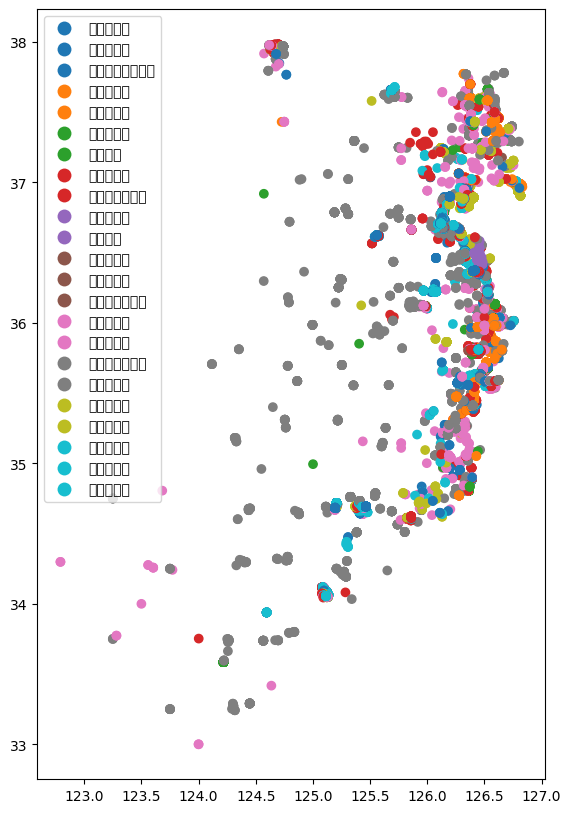

In [8]:
# geopandas.plot을 이용한 지도화
gdf2.plot('phylum_nm',categorical=True, legend=True, figsize=(10, 10))

In [9]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.rc('font', family='Malgun Gothic') #한글 폰트 적용시

<Axes: >

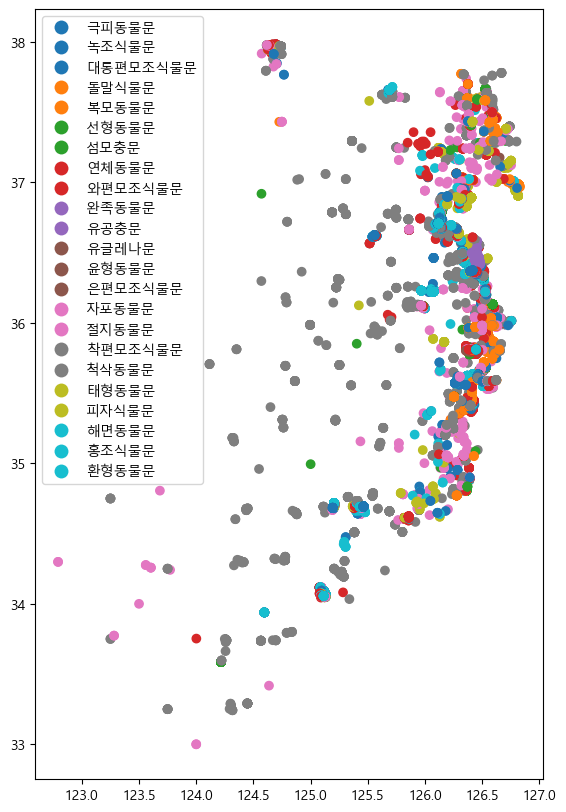

In [10]:
gdf2.plot('phylum_nm',categorical=True, legend=True, figsize=(10, 10))

In [11]:
# 추출된 포인트 공간데이터를 shp으로 저장 
gdf2.to_file('result/mbris_obis_westsea.shp', encoding='UTF-8')

C:\Users\Gaia3D\AppData\Local\Temp\ipykernel_14388\2706972592.py:2: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdf2.to_file('result/mbris_obis_westsea.shp', encoding='UTF-8')
